In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import numpy as np
from os import listdir
from pathlib import Path
from scipy.io import loadmat
from sklearn.model_selection import train_test_split
import h5py
import matplotlib.pyplot as plt
import pickle
from PIL import Image, ImageDraw
from copy import deepcopy
import math
import torch
from torch.utils import data
from networks.AttUnet_model import Att_UNet
from networks.unet import Unet
from networks.DenseUnet import DenseUnet
from networks.unet_dcnn import UNet_dcnn
from networks.cascaded_unet import Cascade_Unet
from networks.trainer import Trainer
import os
import sys
import argparse
from tqdm import tqdm

from evaluation.dose_evaluation_class import *
from networks.AttUnet_model import Att_UNet
from networks.trainer import *
from dataloader.data_loader import DataLoader
from torch.utils import data
#from train import multiple_train

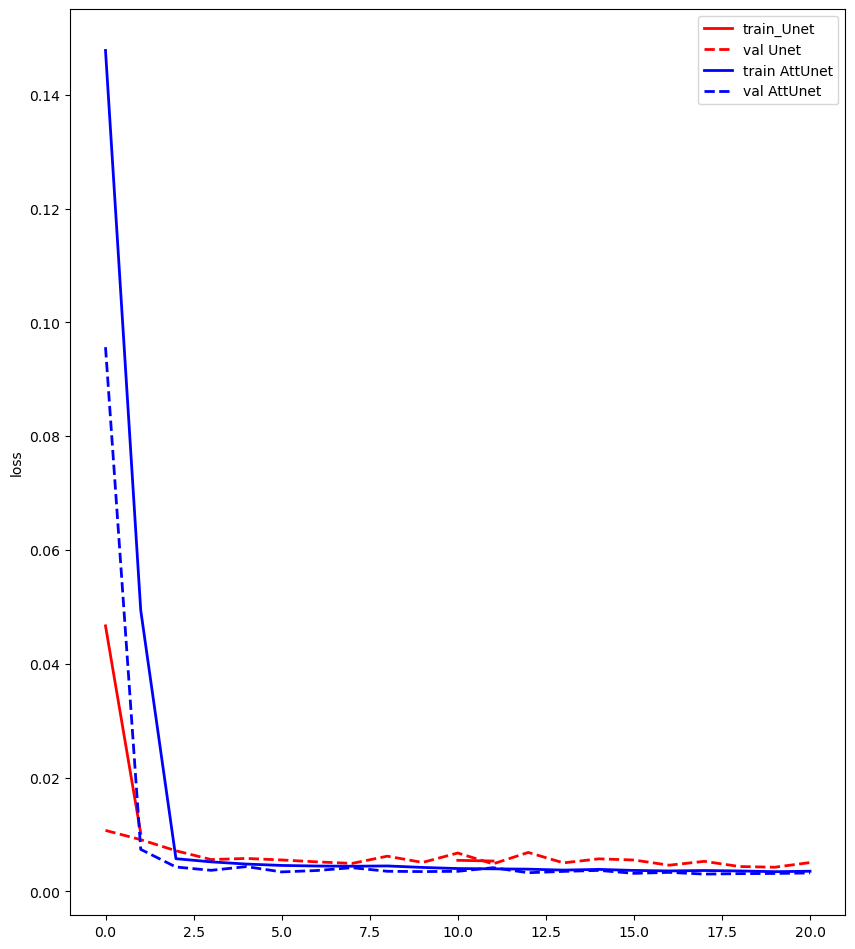

In [7]:
plot_loss_compare()
#plot_loss()

In [8]:
data_loader_eval = DataLoader(data_folder = './Data/test-pats/', mode_name='evaluate')
dose_evaluator = EvaluateDose(data_loader_eval, data_loader_eval)
dvh_score, dose_score, dvh_score_std, dose_score_std = dose_evaluator.make_metrics()
print('For this out-of-sample test:\n'
              '\tthe DVH score is {:.3f}\n '
              '\tthe dose score is {:.3f}'.format(dvh_score, dose_score))
print('For this out-of-sample test:\n'
              '\tthe DVH std is {:.3f}\n '
              '\tthe dose std is {:.3f}'.format(dvh_score_std, dose_score_std))


  0%|          | 0/100 [00:00<?, ?it/s]

./Data/test-pats/


100%|██████████| 100/100 [03:38<00:00,  2.18s/it]

For this out-of-sample test:
	the DVH score is 1.641
 	the dose score is 2.850
For this out-of-sample test:
	the DVH std is 1.950
 	the dose std is 1.125


In [257]:
data_loader_eval = DataLoader(data_folder = './Data/test-pats/', mode_name='evaluate')
dose_evaluator = EvaluateDose(data_loader_eval, data_loader_eval)
dose_score_vec = dose_evaluator.make_metrics_ROI()

for roi in dose_score_vec.keys():
    dose_vec = dose_score_vec[roi]
    print('For this :', roi,'\n'
              '\tthe dose score is {:.3f}\n '
              '\tthe dose score std is {:.3f}'.format(np.nanmean(dose_vec), np.nanstd(dose_vec)))
    

  0%|          | 0/100 [00:00<?, ?it/s]

./Data/test-pats/


100%|██████████| 100/100 [03:23<00:00,  2.03s/it]

For this : PTV70 
	the dose score is 1.347
 	the dose score std is 0.701
For this : PTV63 
	the dose score is 1.944
 	the dose score std is 0.973
For this : PTV56 
	the dose score is 1.700
 	the dose score std is 0.776
For this : Brainstem 
	the dose score is 1.543
 	the dose score std is 2.017
For this : SpinalCord 
	the dose score is 1.802
 	the dose score std is 0.683
For this : RightParotid 
	the dose score is 3.204
 	the dose score std is 1.254
For this : LeftParotid 
	the dose score is 3.174
 	the dose score std is 1.063
For this : Mandible 
	the dose score is 3.878
 	the dose score std is 1.478
For this : Larynx 
	the dose score is 3.016
 	the dose score std is 1.624


dose shape is  (128, 128, 128)


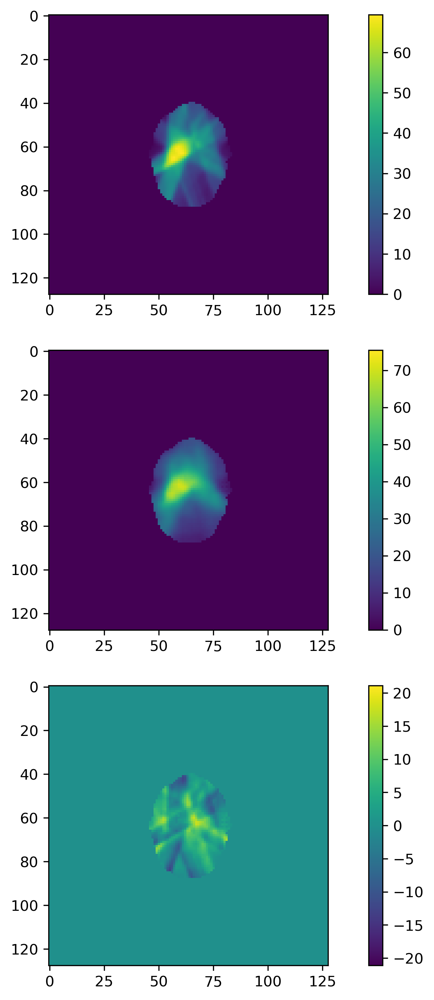

In [153]:
dose_evaluator.plot_dose(3, slice = 50)

roi name  Brainstem
roi size 251
roi name  SpinalCord
roi size 421
roi name  RightParotid
roi size 136
roi name  LeftParotid
roi size 298
roi name  Esophagus
roi name  Larynx
roi name  Mandible
roi size 1839
roi name  PTV56
roi size 2826
roi name  PTV63
roi size 3807
roi name  PTV70
roi size 14610


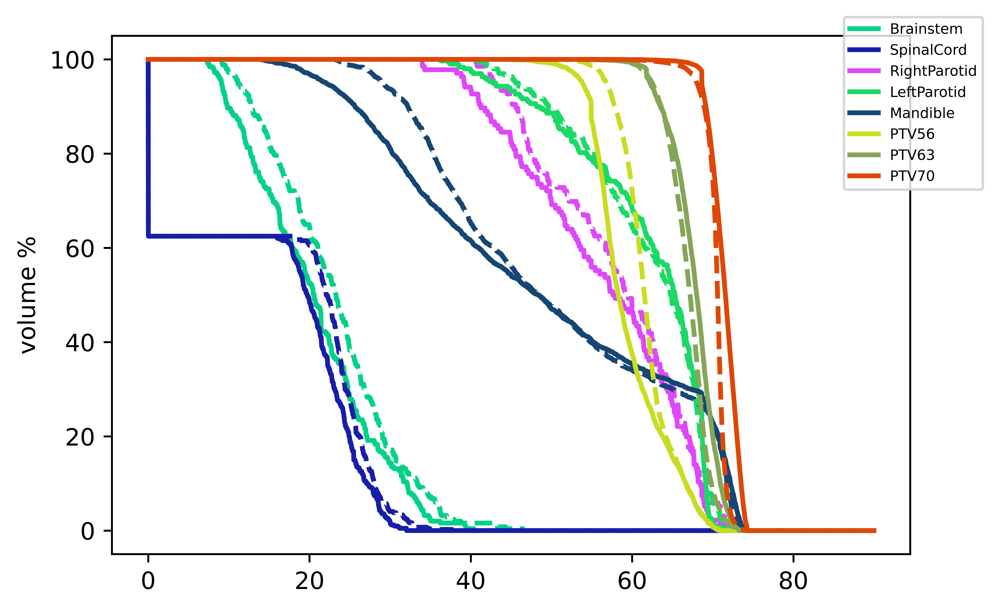

dose shape (2097152,)


<Figure size 432x288 with 0 Axes>

In [143]:
dose_evaluator.plot_DVH(0)

In [195]:
dvh_score, dose_score = dose_evaluator.make_metrics()
print('For this out-of-sample test:\n'
              '\tthe DVH score is {:.3f}\n '
              '\tthe dose score is {:.3f}'.format(dvh_score, dose_score))

100%|██████████| 100/100 [03:22<00:00,  2.03s/it]

For this out-of-sample test:
	the DVH score is 1.986
 	the dose score is 3.269


In [6]:
## generate plans for all plans
training_npy_path = './Data/HN_data/npy_dataset/training/'
data_folder = training_npy_path
training_dataset = PredictionDataSet(data_folder = data_folder, 
                                     structure_list = HN_structures)
training_dataloader = data.DataLoader(dataset=training_dataset,
                                      batch_size=2,
                                      shuffle=True)
x, y = next(iter(training_dataloader))
print(f'x = shape: {x.shape}; type: {x.dtype}')
print(f'x = min: {x.min()}; max: {x.max()}')
print(f'y = shape: {y.shape}; class: {y.unique()}; type: {y.dtype}')


x = shape: torch.Size([2, 10, 128, 128, 128]); type: torch.float32
x = min: 0.0; max: 1.0
y = shape: torch.Size([2, 1, 128, 128, 128]); class: tensor([0.0000e+00, 1.0000e-03, 2.0000e-03,  ..., 7.5541e+01, 7.5804e+01,
        7.5834e+01]); type: torch.float32


In [4]:

model_att = Att_UNet(n_channels=12, n_classes=1)

x = torch.randn(size=(1, 10, 64, 64, 64), dtype=torch.float32)
with torch.no_grad():
    out = model(x)

print(f'Out: {out.shape}')

C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
Out: torch.Size([1, 1, 32, 96, 128])


In [190]:

from networks.AttUnet_model import Att_UNet
from networks.unet import Unet
from networks.DenseUnet import DenseUnet
from networks.unet_dcnn import UNet_dcnn
from networks.cascaded_unet import Cascade_Unet 
#model = Cascade_Unet(in_ch=11, out_ch=1, list_ch_A=[-1, 16, 32, 64, 128, 256],list_ch_B=[-1, 32, 64, 128, 256, 512])
from torchsummary import summary
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # PyTorch v0.4.0
model = UNet(n_channels=11 , n_classes=1)
#model = UNet_dcnn()
summary = summary(model, (11, 128, 128,128), device = 'cpu')

[autoreload of networks.blocks failed: Traceback (most recent call last):
  File "C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\IPython\extensions\autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\IPython\extensions\autoreload.py", line 394, in superreload
    module = reload(module)
  File "C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\imp.py", line 314, in reload
    return importlib.reload(module)
  File "C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\importlib\__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 630, in _exec
  File "<frozen importlib._bootstrap_external>", line 724, in exec_module
  File "<frozen importlib._bootstrap_external>", line 860, in get_code
  File "<frozen importlib._bootstrap_external>", line 791, in source_to_code
  File "<frozen importlib._bootstrap>", line 219, in _call_wit

TypeError: super(type, obj): obj must be an instance or subtype of type

In [14]:
training_data_folder = training_npy_path
validation_data_folder = validation_npy_path
training_dataset = PredictionDataSet(data_folder = training_data_folder)
validation_dataset = PredictionDataSet(data_folder = validation_data_folder)
dataloader_training = data.DataLoader(dataset=training_dataset,
                                      batch_size=4,
                                      shuffle=True)

dataloader_validation = data.DataLoader(dataset=validation_dataset,
                                      batch_size=4,
                                      shuffle=True)
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    torch.device('cpu')

# model
model = Att_UNet(n_channels=10, n_classes=1).to(device)



In [10]:
# criterion
criterion = torch.nn.MSELoss()

# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)

# trainer
trainer = Trainer(model=model,
                  device=device,
                  criterion=criterion,
                  optimizer=optimizer,
                  training_DataLoader=dataloader_training,
                  validation_DataLoader=dataloader_validation,
                  lr_scheduler=None,
                  epochs=2000,
                  epoch=0,
                  notebook=True)

# start training
training_losses, validation_losses, lr_rates = trainer.run_trainer()

Progress:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 38.64701843261719
Validation Loss Decreased(inf--->38.647018) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 106.15029907226562


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 101.64166259765625


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 82.53548431396484


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 38.82526779174805


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 34.7701530456543
Validation Loss Decreased(38.647018--->34.770153) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 34.088043212890625
Validation Loss Decreased(34.770153--->34.088043) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 29.243911743164062
Validation Loss Decreased(34.088043--->29.243912) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 21.610095977783203
Validation Loss Decreased(29.243912--->21.610096) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 13.055469512939453
Validation Loss Decreased(21.610096--->13.055470) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 11.016562461853027
Validation Loss Decreased(13.055470--->11.016562) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 8.4867582321167
Validation Loss Decreased(11.016562--->8.486758) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 7.992491722106934
Validation Loss Decreased(8.486758--->7.992492) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 6.934370994567871
Validation Loss Decreased(7.992492--->6.934371) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 6.263693809509277
Validation Loss Decreased(6.934371--->6.263694) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 5.72916316986084
Validation Loss Decreased(6.263694--->5.729163) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 5.246089935302734
Validation Loss Decreased(5.729163--->5.246090) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.989508152008057
Validation Loss Decreased(5.246090--->4.989508) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.688670635223389
Validation Loss Decreased(4.989508--->4.688671) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.609378814697266
Validation Loss Decreased(4.688671--->4.609379) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.319544792175293
Validation Loss Decreased(4.609379--->4.319545) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.515660285949707


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.562582969665527


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.798556327819824


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.007265567779541
Validation Loss Decreased(4.319545--->4.007266) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.995067596435547
Validation Loss Decreased(4.007266--->3.995068) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.084280014038086


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.006040573120117


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.764338970184326
Validation Loss Decreased(3.995068--->3.764339) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.665952205657959
Validation Loss Decreased(3.764339--->3.665952) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.6867663860321045


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.174371719360352


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.5417098999023438
Validation Loss Decreased(3.665952--->3.541710) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.5151004791259766
Validation Loss Decreased(3.541710--->3.515100) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.4518589973449707
Validation Loss Decreased(3.515100--->3.451859) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.463312864303589


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.3811287879943848
Validation Loss Decreased(3.451859--->3.381129) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.316164970397949
Validation Loss Decreased(3.381129--->3.316165) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.8278937339782715


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 4.382318496704102


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.287187337875366
Validation Loss Decreased(3.316165--->3.287187) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.2451744079589844
Validation Loss Decreased(3.287187--->3.245174) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.110745906829834
Validation Loss Decreased(3.245174--->3.110746) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.338405132293701


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.1476831436157227


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.2281033992767334


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.5360705852508545


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.2050094604492188


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.0428779125213623
Validation Loss Decreased(3.110746--->3.042878) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.962000608444214
Validation Loss Decreased(3.042878--->2.962001) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.0011301040649414


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.052021026611328


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.287001371383667


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.743621826171875


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.315443754196167


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.1107633113861084


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.8658292293548584
Validation Loss Decreased(2.962001--->2.865829) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.7726266384124756
Validation Loss Decreased(2.865829--->2.772627) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.2138614654541016


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.203723430633545


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.9052047729492188


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.7386627197265625
Validation Loss Decreased(2.772627--->2.738663) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.8338782787323


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.9194114208221436


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.668583869934082
Validation Loss Decreased(2.738663--->2.668584) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.6681761741638184
Validation Loss Decreased(2.668584--->2.668176) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.6274352073669434
Validation Loss Decreased(2.668176--->2.627435) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.6115195751190186
Validation Loss Decreased(2.627435--->2.611520) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.840278148651123


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.5617244243621826
Validation Loss Decreased(2.611520--->2.561724) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.218705177307129


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.75378680229187


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.5890607833862305


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.752959728240967


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.5819432735443115


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.61167573928833


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.5662994384765625


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 3.1999595165252686


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.4841480255126953
Validation Loss Decreased(2.561724--->2.484148) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.8062636852264404


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.472263813018799
Validation Loss Decreased(2.484148--->2.472264) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.6374638080596924


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.6709678173065186


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.4528439044952393
Validation Loss Decreased(2.472264--->2.452844) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.807011127471924


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.383195400238037
Validation Loss Decreased(2.452844--->2.383195) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.6183829307556152


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.7093544006347656


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.4168388843536377


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.808995008468628


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.385091543197632


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.4406538009643555


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.4651176929473877


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.3614864349365234
Validation Loss Decreased(2.383195--->2.361486) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.3256688117980957
Validation Loss Decreased(2.361486--->2.325669) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.526437282562256


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.3579540252685547


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.4116060733795166


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.326986312866211


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.3874359130859375


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.373190402984619


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.3635804653167725


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.2570018768310547
Validation Loss Decreased(2.325669--->2.257002) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.279555082321167


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.302898406982422


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.6906821727752686


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.390862464904785


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.324220657348633


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.2402796745300293
Validation Loss Decreased(2.257002--->2.240280) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.3228273391723633


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.964689254760742


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.3659894466400146


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.3239994049072266


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.4217097759246826


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.429743766784668


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.204684019088745
Validation Loss Decreased(2.240280--->2.204684) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.4328441619873047


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.2998671531677246


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.221787452697754


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.3219046592712402


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.317318916320801


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.212503433227539


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.212939977645874


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.2288856506347656


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.186160087585449
Validation Loss Decreased(2.204684--->2.186160) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1077933311462402
Validation Loss Decreased(2.186160--->2.107793) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.31050968170166


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.152195453643799


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1083319187164307


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1080377101898193


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.139260768890381


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1667866706848145


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.2082407474517822


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.6788489818573


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.2858028411865234


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.183215379714966


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.15549898147583


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.678455114364624


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.6423070430755615


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.099104166030884
Validation Loss Decreased(2.107793--->2.099104) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1836776733398438


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.075977087020874
Validation Loss Decreased(2.099104--->2.075977) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.07839298248291


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.220818281173706


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.138173818588257


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.097355365753174


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1386117935180664


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1718316078186035


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.2689671516418457


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.085545301437378


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0711703300476074
Validation Loss Decreased(2.075977--->2.071170) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1725146770477295


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.276233434677124


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.169665813446045


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.076955556869507


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.136512041091919


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.285271644592285


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1364691257476807


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.142695903778076


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.23340106010437


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.055626392364502
Validation Loss Decreased(2.071170--->2.055626) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1079349517822266


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0972886085510254


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.172281503677368


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.2102372646331787


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.163360834121704


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.2288575172424316


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.088413715362549


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.117863416671753


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1838464736938477


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0568764209747314


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0764448642730713


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0704312324523926


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1422119140625


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.338453769683838


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1643056869506836


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.092334270477295


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1414504051208496


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.1782546043395996


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.48956561088562


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.5925087928771973


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.3665781021118164


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.3165483474731445


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.166264057159424


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.044374465942383
Validation Loss Decreased(2.055626--->2.044374) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0616559982299805


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.051936149597168


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.082324504852295


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.107783794403076


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.063473701477051


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0069048404693604
Validation Loss Decreased(2.044374--->2.006905) 	 Saving The Model


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0280399322509766


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0650618076324463


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.197970151901245


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.123077154159546


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0681588649749756


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0574536323547363


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0759987831115723


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.025280475616455


Training:   0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/1 [00:00<?, ?it/s]

Validation Loss: 2.0400748252868652


In [ ]:
training_losses

In [24]:
model_name =  'AttUnet_model.pt'
torch.save(model.state_dict(), str(Path.cwd())+'/pytorch_programs'+'/'+model_name)

In [25]:
model_name =  'test_model.pt'
str(Path.cwd())+'/pytorch_programs'+'/'+model_name

'c:\\ddu\\radiotherapy-dose-prediction/pytorch_programs/test_model.pt'

Data/npy_dataset/training_test/
data_dirs is ['pt_0', 'pt_1', 'pt_10', 'pt_11', 'pt_12', 'pt_13', 'pt_14', 'pt_15', 'pt_16', 'pt_17', 'pt_18', 'pt_19', 'pt_2', 'pt_3', 'pt_4', 'pt_5', 'pt_6', 'pt_7', 'pt_8', 'pt_9']
work on test patient  pt_0
c:\ddu\radiotherapy-dose-prediction\pytorch_programs\weight_init.py:42: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight.data, a=0, mode='fan_in')
c:\ddu\radiotherapy-dose-prediction\pytorch_programs\weight_init.py:46: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  init.normal(m.weight.data, 1.0, 0.02)
c:\ddu\radiotherapy-dose-prediction\pytorch_programs\weight_init.py:47: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias.data, 0.0)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.inter

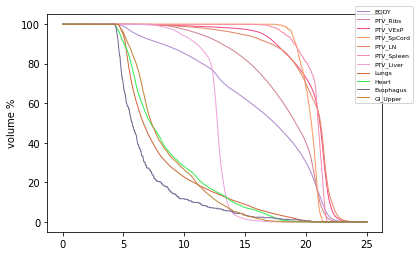

BODY
True mean organ dose is:  15.668302
True max organ dose is:  25.201588
PTV_Ribs
True mean organ dose is:  18.43423
True max organ dose is:  23.837236
PTV_VExP
True mean organ dose is:  20.250057
True max organ dose is:  24.894615
PTV_SpCord
True mean organ dose is:  20.41049
True max organ dose is:  22.838497
PTV_LN
True mean organ dose is:  19.82786
True max organ dose is:  24.161469
PTV_Spleen
True mean organ dose is:  20.73615
True max organ dose is:  22.896248
PTV_Liver
True mean organ dose is:  12.207093
True max organ dose is:  18.826927
Lungs
True mean organ dose is:  8.076023
True max organ dose is:  24.96551
Heart
True mean organ dose is:  8.148581
True max organ dose is:  20.295351
Esophagus
True mean organ dose is:  6.510077
True max organ dose is:  17.93317
GI_Upper
True mean organ dose is:  8.423126
True max organ dose is:  19.08235
Breasts  not exist


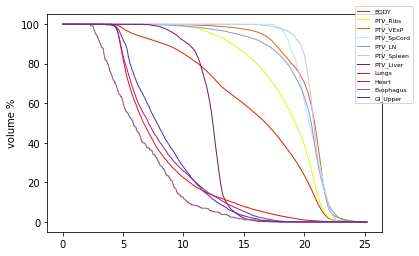

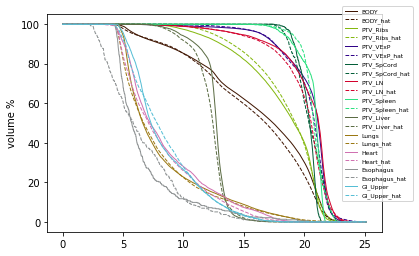

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.024309,0.006911,-0.022215,-0.059898,-0.005886,-0.004505
PTV_Ribs,0.018542,0.018010,0.104929,0.149819,0.009848,0.014429
PTV_VExP,-0.005083,0.013295,0.003088,0.035577,-0.000468,0.014171
PTV_SpCord,0.007443,0.061063,-0.025785,-0.025812,0.049809,0.055394
PTV_LN,-0.019083,-0.000386,-0.007745,0.016718,-0.000956,0.004148
PTV_Spleen,0.003373,0.047811,0.041370,0.024879,0.030246,0.038304
PTV_Liver,-0.025301,0.039498,-0.041099,-0.033714,0.022290,0.018888
Lungs,-0.015637,0.126353,-0.071714,-0.061802,-0.012525,0.004249
Heart,-0.043038,0.005850,-0.019798,-0.009965,-0.069887,-0.050875


work on test patient  pt_1
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use 

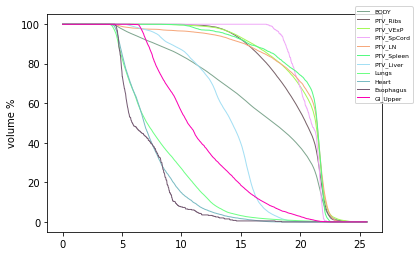

BODY
True mean organ dose is:  15.964465
True max organ dose is:  26.35241
PTV_Ribs
True mean organ dose is:  19.809109
True max organ dose is:  24.919804
PTV_VExP
True mean organ dose is:  20.210747
True max organ dose is:  24.858564
PTV_SpCord
True mean organ dose is:  20.639963
True max organ dose is:  23.528074
PTV_LN
True mean organ dose is:  19.949127
True max organ dose is:  24.745005
PTV_Spleen
True mean organ dose is:  20.23281
True max organ dose is:  23.352617
PTV_Liver
True mean organ dose is:  12.784946
True max organ dose is:  19.89916
Lungs
True mean organ dose is:  7.6203113
True max organ dose is:  23.332636
Heart
True mean organ dose is:  7.1034517
True max organ dose is:  19.604
Esophagus
True mean organ dose is:  6.7179623
True max organ dose is:  17.239716
GI_Upper
True mean organ dose is:  10.948469
True max organ dose is:  22.93319
Breasts  not exist


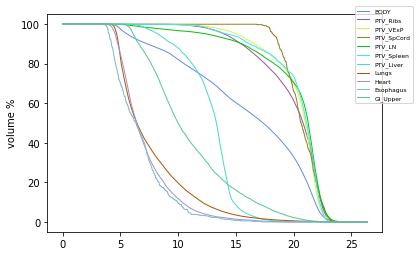

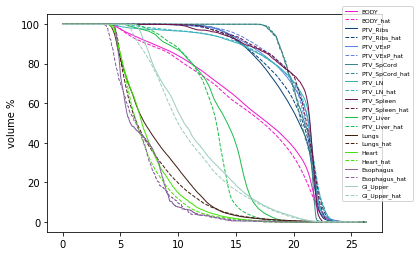

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.024884,0.029017,-0.044964,0.012770,0.000565,0.000562
PTV_Ribs,0.012762,-0.019950,-0.023306,-0.052667,0.017768,0.017915
PTV_VExP,0.004264,-0.008836,0.039935,0.019955,0.003115,0.000290
PTV_SpCord,0.004154,0.055644,-0.004851,0.009686,0.040464,0.050643
PTV_LN,0.004542,0.049208,0.007800,0.287339,0.016074,0.017990
PTV_Spleen,0.002193,0.024598,0.034755,0.122242,0.018870,0.020728
PTV_Liver,-0.058492,-0.016351,0.040598,0.118674,-0.093521,-0.074604
Lungs,-0.056555,-0.000465,0.037787,0.056662,0.012835,0.018542
Heart,-0.047914,0.062153,-0.011000,-0.024361,-0.062148,-0.032095


work on test patient  pt_10
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated

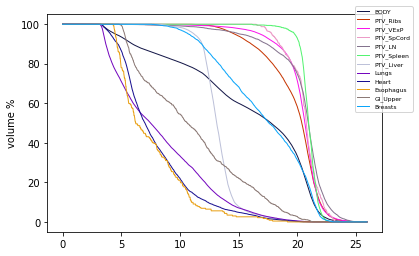

BODY
True mean organ dose is:  15.686686
True max organ dose is:  25.29836
PTV_Ribs
True mean organ dose is:  19.363157
True max organ dose is:  25.152746
PTV_VExP
True mean organ dose is:  20.214333
True max organ dose is:  25.101124
PTV_SpCord
True mean organ dose is:  20.881466
True max organ dose is:  22.469124
PTV_LN
True mean organ dose is:  20.245224
True max organ dose is:  24.663404
PTV_Spleen
True mean organ dose is:  20.21269
True max organ dose is:  22.139725
PTV_Liver
True mean organ dose is:  12.7735195
True max organ dose is:  19.324774
Lungs
True mean organ dose is:  9.052987
True max organ dose is:  20.906803
Heart
True mean organ dose is:  7.886352
True max organ dose is:  19.683619
Esophagus
True mean organ dose is:  8.431052
True max organ dose is:  16.505499
GI_Upper
True mean organ dose is:  11.074109
True max organ dose is:  20.457813
Breasts
True mean organ dose is:  17.480358
True max organ dose is:  22.789106


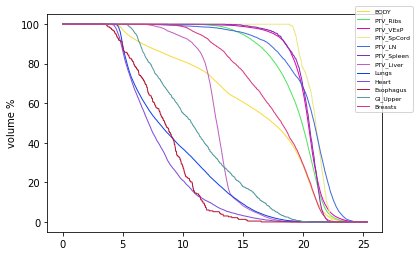

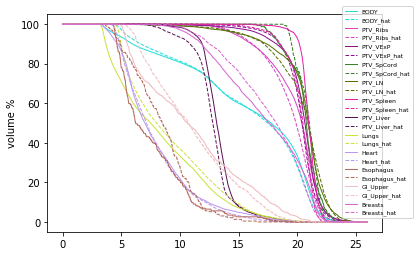

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.000469,-0.025150,0.190549,0.331837,-0.006604,-0.007119
PTV_Ribs,-0.015807,-0.030762,0.017908,0.018905,-0.019512,-0.019658
PTV_VExP,-0.004518,-0.019550,0.043089,0.080607,-0.007077,-0.007635
PTV_SpCord,0.014708,-0.039806,0.084902,0.107020,-0.015037,-0.032294
PTV_LN,-0.005875,-0.028871,0.018325,0.055399,-0.003779,-0.012912
PTV_Spleen,-0.034924,-0.028493,-0.096746,-0.136887,-0.017678,-0.017757
PTV_Liver,-0.036970,-0.069896,-0.161675,-0.194370,0.007584,-0.040050
Lungs,0.089095,-0.066762,0.384359,0.391035,0.005535,-0.025150
Heart,-0.006184,-0.065405,0.132682,0.217695,-0.065982,-0.078004


work on test patient  pt_11
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated

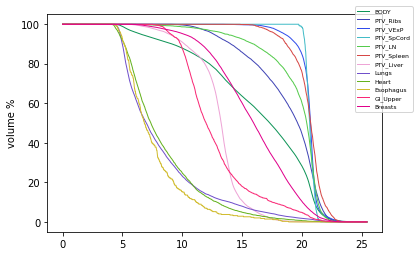

BODY
True mean organ dose is:  15.957592
True max organ dose is:  26.012655
PTV_Ribs
True mean organ dose is:  18.917068
True max organ dose is:  24.281872
PTV_VExP
True mean organ dose is:  20.48223
True max organ dose is:  25.431696
PTV_SpCord
True mean organ dose is:  21.601513
True max organ dose is:  22.669228
PTV_LN
True mean organ dose is:  19.580996
True max organ dose is:  23.728592
PTV_Spleen
True mean organ dose is:  20.177982
True max organ dose is:  23.1938
PTV_Liver
True mean organ dose is:  12.74238
True max organ dose is:  20.420935
Lungs
True mean organ dose is:  8.295567
True max organ dose is:  25.462524
Heart
True mean organ dose is:  8.075737
True max organ dose is:  19.167156
Esophagus
True mean organ dose is:  7.9251485
True max organ dose is:  15.28448
GI_Upper
True mean organ dose is:  12.41259
True max organ dose is:  21.80964
Breasts
True mean organ dose is:  15.36307
True max organ dose is:  23.60826


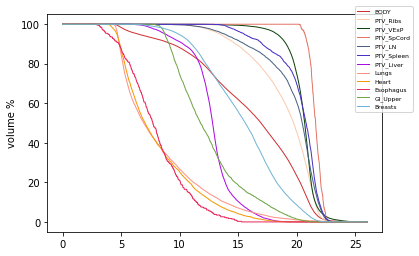

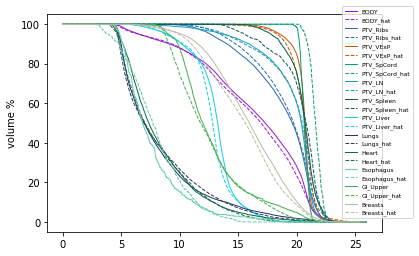

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.014898,0.022810,-0.007097,-0.031412,0.001009,-0.004230
PTV_Ribs,0.015317,0.031349,0.066071,0.061622,0.000173,-0.003506
PTV_VExP,-0.002059,0.009020,-0.012242,-0.023850,0.022810,0.018730
PTV_SpCord,0.045893,0.052974,0.027979,0.017618,0.057149,0.056374
PTV_LN,0.009200,-0.005015,0.009539,0.105709,0.024616,0.016908
PTV_Spleen,-0.015055,-0.013471,-0.128528,-0.142235,-0.003446,-0.008741
PTV_Liver,-0.018797,-0.010945,-0.012208,0.024555,-0.002821,-0.006478
Lungs,0.001887,0.017575,-0.020484,-0.018995,-0.039859,-0.055766
Heart,-0.031491,-0.152100,-0.021064,-0.029943,-0.019807,-0.075339


work on test patient  pt_12
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated

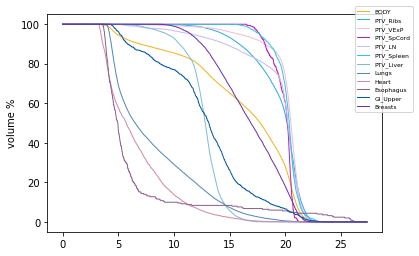

BODY
True mean organ dose is:  16.048407
True max organ dose is:  24.34281
PTV_Ribs
True mean organ dose is:  19.183565
True max organ dose is:  23.723804
PTV_VExP
True mean organ dose is:  19.998964
True max organ dose is:  24.132734
PTV_SpCord
True mean organ dose is:  20.18541
True max organ dose is:  22.156136
PTV_LN
True mean organ dose is:  19.659153
True max organ dose is:  23.504526
PTV_Spleen
True mean organ dose is:  19.743246
True max organ dose is:  22.487827
PTV_Liver
True mean organ dose is:  12.346023
True max organ dose is:  18.730661
Lungs
True mean organ dose is:  8.489074
True max organ dose is:  23.869967
Heart
True mean organ dose is:  6.8867693
True max organ dose is:  19.092018
Esophagus
True mean organ dose is:  7.155259
True max organ dose is:  20.683214
GI_Upper
True mean organ dose is:  12.713414
True max organ dose is:  22.346027
Breasts
True mean organ dose is:  16.691948
True max organ dose is:  22.830828


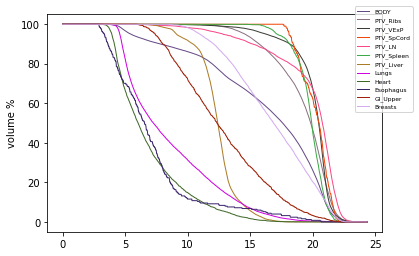

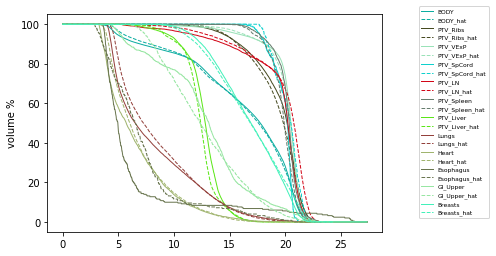

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,0.001733,-0.071922,0.119932,0.096187,0.004188,0.008120
PTV_Ribs,-0.008055,0.017777,0.010573,0.037643,0.000491,0.003251
PTV_VExP,-0.000840,-0.056441,0.027511,0.080648,0.000767,0.005616
PTV_SpCord,0.019881,0.043927,0.022681,0.038270,0.048341,0.046036
PTV_LN,0.029334,-0.022688,0.104832,0.331807,0.026817,0.026048
PTV_Spleen,-0.019341,-0.039241,-0.030214,-0.019686,-0.010168,-0.026314
PTV_Liver,-0.023004,0.011041,-0.029739,0.085261,0.000887,0.006722
Lungs,0.046142,0.050507,0.082911,0.076834,-0.013122,-0.029824
Heart,0.043737,-0.057188,0.140684,0.111524,0.022773,-0.027696


work on test patient  pt_13
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated

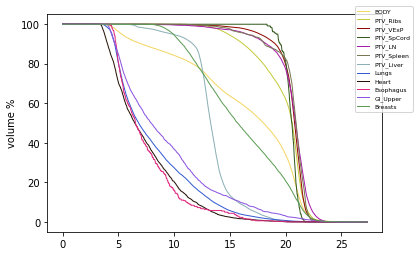

BODY
True mean organ dose is:  15.98692
True max organ dose is:  26.177309
PTV_Ribs
True mean organ dose is:  19.431427
True max organ dose is:  24.342167
PTV_VExP
True mean organ dose is:  20.274723
True max organ dose is:  25.6921
PTV_SpCord
True mean organ dose is:  20.724691
True max organ dose is:  22.917862
PTV_LN
True mean organ dose is:  19.990488
True max organ dose is:  24.257431
PTV_Spleen
True mean organ dose is:  20.31607
True max organ dose is:  24.017302
PTV_Liver
True mean organ dose is:  13.147105
True max organ dose is:  21.333567
Lungs
True mean organ dose is:  8.694502
True max organ dose is:  23.591839
Heart
True mean organ dose is:  7.6217175
True max organ dose is:  19.278053
Esophagus
True mean organ dose is:  8.159884
True max organ dose is:  16.764275
GI_Upper
True mean organ dose is:  9.300574
True max organ dose is:  22.616117
Breasts
True mean organ dose is:  16.074762
True max organ dose is:  23.82043


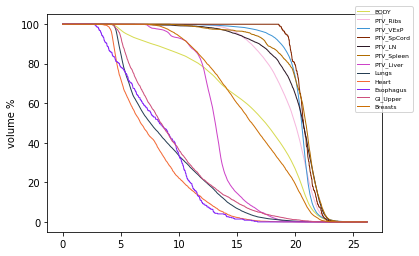

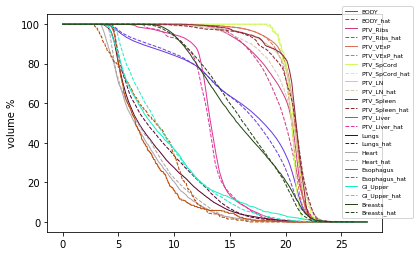

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.012502,-0.041564,0.044893,0.031513,-0.004840,-0.001091
PTV_Ribs,-0.013909,-0.014856,0.021979,0.027169,0.002406,0.004520
PTV_VExP,-0.011096,-0.015827,-0.000150,-0.004827,-0.003896,0.009097
PTV_SpCord,0.013502,0.053557,-0.000605,0.002318,0.044394,0.046232
PTV_LN,-0.023221,-0.084788,-0.092342,-0.044451,-0.002504,-0.007864
PTV_Spleen,-0.008453,0.022279,-0.017009,-0.160812,0.022133,0.025633
PTV_Liver,-0.018432,-0.024767,-0.068113,0.033917,-0.014331,-0.025403
Lungs,0.065324,-0.044892,0.052805,0.104908,0.014565,-0.035715
Heart,0.034264,-0.081176,0.121059,0.126071,0.024468,-0.010070


work on test patient  pt_14
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use

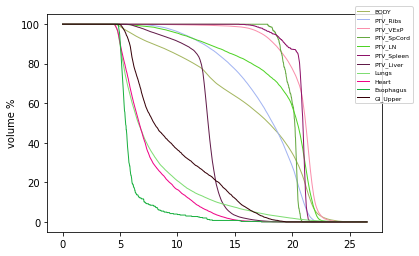

BODY
True mean organ dose is:  16.127743
True max organ dose is:  25.997738
PTV_Ribs
True mean organ dose is:  18.162867
True max organ dose is:  24.484016
PTV_VExP
True mean organ dose is:  20.77434
True max organ dose is:  25.997738
PTV_SpCord
True mean organ dose is:  20.709803
True max organ dose is:  22.77867
PTV_LN
True mean organ dose is:  19.179178
True max organ dose is:  24.271852
PTV_Spleen
True mean organ dose is:  20.820808
True max organ dose is:  23.421488
PTV_Liver
True mean organ dose is:  12.2817545
True max organ dose is:  19.562376
Lungs
True mean organ dose is:  7.535413
True max organ dose is:  24.95555
Heart
True mean organ dose is:  6.9768476
True max organ dose is:  19.043266
Esophagus
True mean organ dose is:  5.334584
True max organ dose is:  16.751266
GI_Upper
True mean organ dose is:  9.23966
True max organ dose is:  19.56009
Breasts  not exist


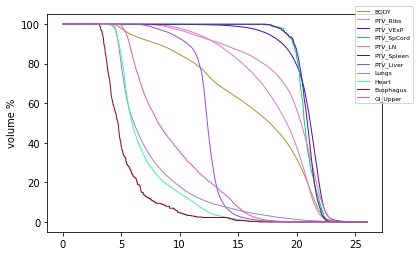

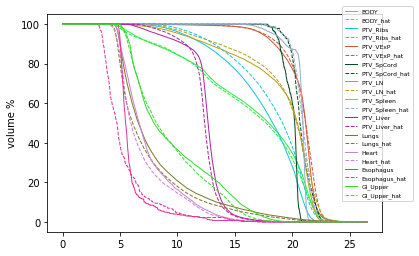

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.011740,-0.018675,-0.050674,-0.043518,-0.002761,-0.016964
PTV_Ribs,0.043313,0.054343,0.096267,0.100231,0.024045,0.028828
PTV_VExP,0.006530,0.062579,0.011221,-0.006609,0.008179,0.005386
PTV_SpCord,0.041128,0.093144,0.031722,0.021917,0.076496,0.081781
PTV_LN,0.018314,-0.044982,0.081616,0.121961,0.022732,0.026383
PTV_Spleen,0.009779,0.083002,0.041421,0.072454,0.037541,0.045246
PTV_Liver,-0.013162,-0.013159,0.125316,0.157509,-0.012424,-0.012892
Lungs,-0.062090,-0.058014,-0.045487,-0.043553,-0.062220,-0.044984
Heart,-0.062893,0.013589,-0.053435,-0.057375,-0.035802,-0.002274


work on test patient  pt_15
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
True mean organ dose is:  16.411825
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn(

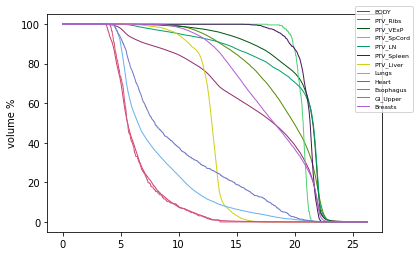

BODY
True mean organ dose is:  16.039661
True max organ dose is:  26.229921
PTV_Ribs
True mean organ dose is:  18.949665
True max organ dose is:  24.006111
PTV_VExP
True mean organ dose is:  20.084047
True max organ dose is:  26.229921
PTV_SpCord
True mean organ dose is:  20.634657
True max organ dose is:  22.218498
PTV_LN
True mean organ dose is:  19.822691
True max organ dose is:  24.264769
PTV_Spleen
True mean organ dose is:  20.25652
True max organ dose is:  23.02685
PTV_Liver
True mean organ dose is:  12.279689
True max organ dose is:  18.212376
Lungs
True mean organ dose is:  8.044581
True max organ dose is:  24.491728
Heart
True mean organ dose is:  6.249694
True max organ dose is:  18.46117
Esophagus
True mean organ dose is:  6.633535
True max organ dose is:  13.825858
GI_Upper
True mean organ dose is:  10.494928
True max organ dose is:  20.722733
Breasts
True mean organ dose is:  17.428173
True max organ dose is:  24.826155


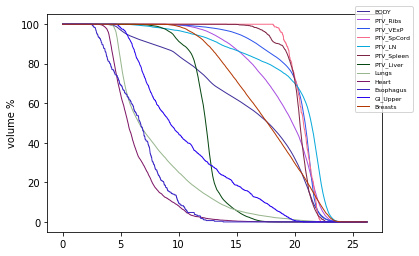

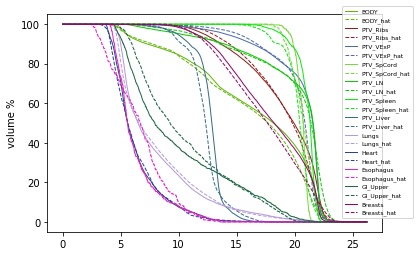

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.022677,-0.000601,0.001779,-0.037421,-0.006514,-0.001182
PTV_Ribs,0.000818,-0.004230,0.059513,0.063063,-0.000016,0.006335
PTV_VExP,-0.013676,0.009134,0.076778,0.129162,-0.010029,-0.003509
PTV_SpCord,0.001740,0.025221,-0.031455,-0.027389,0.034010,0.033798
PTV_LN,0.004533,-0.001476,0.103852,0.201463,0.023446,0.024297
PTV_Spleen,-0.035641,0.021566,-0.065930,-0.052422,-0.007156,0.006521
PTV_Liver,-0.029600,0.034588,-0.041636,-0.006640,0.041716,0.054020
Lungs,0.003715,-0.011317,-0.033368,-0.023444,-0.027590,-0.011048
Heart,-0.009199,-0.032800,-0.007133,-0.031091,-0.049809,-0.013292


work on test patient  pt_16
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
True mean organ dose is:  15.923422
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn(

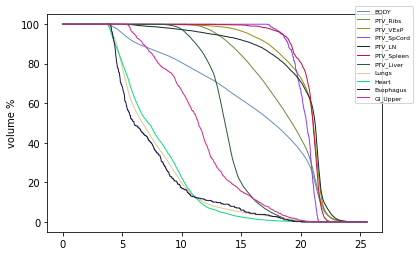

BODY
True mean organ dose is:  15.711881
True max organ dose is:  24.917654
PTV_Ribs
True mean organ dose is:  18.818447
True max organ dose is:  24.30209
PTV_VExP
True mean organ dose is:  20.273989
True max organ dose is:  24.642244
PTV_SpCord
True mean organ dose is:  20.154652
True max organ dose is:  22.182621
PTV_LN
True mean organ dose is:  19.973284
True max organ dose is:  24.917654
PTV_Spleen
True mean organ dose is:  20.357456
True max organ dose is:  23.006905
PTV_Liver
True mean organ dose is:  13.108634
True max organ dose is:  20.113005
Lungs
True mean organ dose is:  7.719778
True max organ dose is:  23.905434
Heart
True mean organ dose is:  7.6846576
True max organ dose is:  19.528189
Esophagus
True mean organ dose is:  7.482892
True max organ dose is:  16.201391
GI_Upper
True mean organ dose is:  11.464099
True max organ dose is:  21.75825
Breasts  not exist


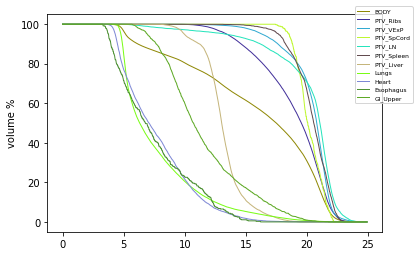

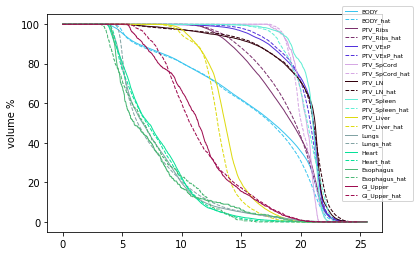

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.013285,-0.025097,0.009025,0.077379,-0.006980,-0.012959
PTV_Ribs,0.014746,-0.012902,0.037397,0.018370,0.002564,0.000893
PTV_VExP,0.001281,0.011701,0.041645,0.062169,0.003096,0.008616
PTV_SpCord,-0.004132,0.031747,0.008848,0.021428,0.024524,0.028418
PTV_LN,0.003884,0.031542,0.061363,-0.072314,0.012677,0.016273
PTV_Spleen,-0.014967,0.020098,-0.041975,-0.029446,0.024049,0.027586
PTV_Liver,-0.044453,-0.021340,-0.046549,-0.042845,-0.064350,-0.053988
Lungs,-0.000724,0.017514,0.128060,0.158671,0.015663,-0.026447
Heart,-0.012256,-0.061160,0.047567,0.047469,-0.002577,-0.045206


work on test patient  pt_17
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
True mean organ dose is:  16.34446
True max organ dose is:  25.483337
PTV_Ribs
True mean organ dose is:  19.482754
True max organ dose is:  24.516693
PTV_VExP
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages

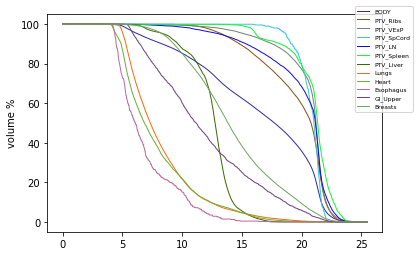

BODY
True mean organ dose is:  16.013462
True max organ dose is:  24.487026
PTV_Ribs
True mean organ dose is:  19.518652
True max organ dose is:  24.076988
PTV_VExP
True mean organ dose is:  20.358564
True max organ dose is:  24.470835
PTV_SpCord
True mean organ dose is:  20.414402
True max organ dose is:  23.256432
PTV_LN
True mean organ dose is:  19.614258
True max organ dose is:  24.240137
PTV_Spleen
True mean organ dose is:  20.360872
True max organ dose is:  23.433826
PTV_Liver
True mean organ dose is:  12.141804
True max organ dose is:  18.10857
Lungs
True mean organ dose is:  8.017161
True max organ dose is:  23.459423
Heart
True mean organ dose is:  7.5023513
True max organ dose is:  19.036924
Esophagus
True mean organ dose is:  6.403493
True max organ dose is:  16.29745
GI_Upper
True mean organ dose is:  11.864972
True max organ dose is:  22.19521
Breasts
True mean organ dose is:  13.916893
True max organ dose is:  23.334974


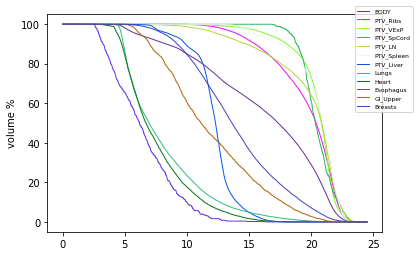

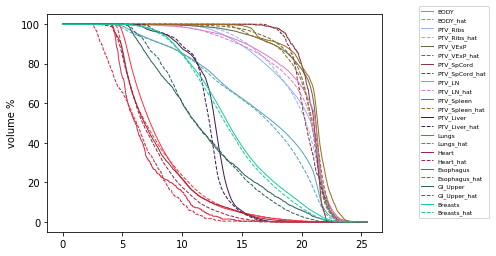

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.020251,-0.039097,-0.052576,-0.061867,-0.006919,-0.010978
PTV_Ribs,0.001843,-0.017935,0.053333,0.053337,-0.000333,-0.004779
PTV_VExP,-0.004321,-0.025951,0.075316,0.125576,-0.004701,-0.010381
PTV_SpCord,-0.014149,0.037387,-0.016796,-0.011215,0.033055,0.039310
PTV_LN,-0.013334,-0.016884,-0.045602,0.002036,-0.003468,-0.006802
PTV_Spleen,-0.025471,-0.032162,-0.039097,-0.073276,-0.026886,-0.031276
PTV_Liver,-0.022695,-0.015232,0.012689,0.073951,-0.012427,-0.016380
Lungs,-0.024548,-0.006456,-0.065654,-0.056659,0.009861,0.009763
Heart,-0.046011,-0.065538,-0.008983,-0.013126,-0.114348,-0.109533


work on test patient  pt_18
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
True mean organ dose is:  15.435922
True max organ dose is:  25.611158
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torc

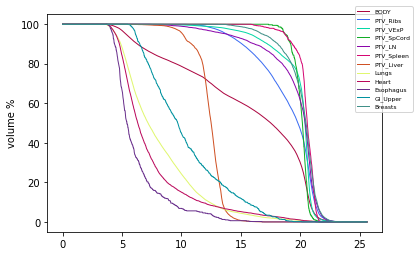

BODY
True mean organ dose is:  15.339814
True max organ dose is:  24.388577
PTV_Ribs
True mean organ dose is:  18.772608
True max organ dose is:  24.388577
PTV_VExP
True mean organ dose is:  19.848167
True max organ dose is:  24.06432
PTV_SpCord
True mean organ dose is:  20.264336
True max organ dose is:  21.788305
PTV_LN
True mean organ dose is:  19.418003
True max organ dose is:  24.388577
PTV_Spleen
True mean organ dose is:  20.269026
True max organ dose is:  22.187902
PTV_Liver
True mean organ dose is:  12.054606
True max organ dose is:  18.84286
Lungs
True mean organ dose is:  8.235307
True max organ dose is:  22.818172
Heart
True mean organ dose is:  7.307563
True max organ dose is:  21.209566
Esophagus
True mean organ dose is:  6.825817
True max organ dose is:  16.638784
GI_Upper
True mean organ dose is:  10.512402
True max organ dose is:  19.426178
Breasts
True mean organ dose is:  19.43213
True max organ dose is:  23.251951


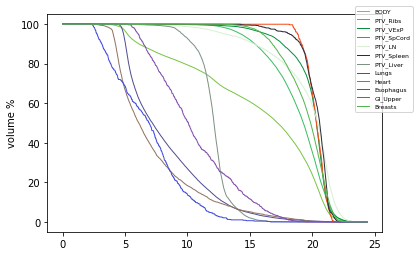

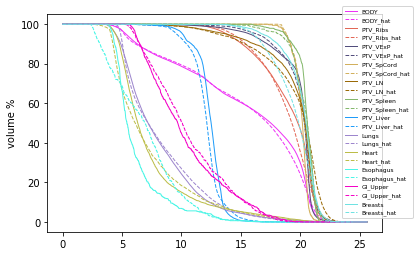

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.006226,-0.047736,-0.027184,0.014032,0.007735,0.008845
PTV_Ribs,-0.006851,0.010058,0.036105,0.037871,0.006711,0.006218
PTV_VExP,0.006153,-0.060397,0.037356,0.078220,0.021688,0.029013
PTV_SpCord,0.011684,0.010565,0.005674,0.006603,0.028492,0.024133
PTV_LN,-0.002922,0.048802,-0.054784,-0.019569,0.022134,0.023212
PTV_Spleen,-0.008057,0.019783,-0.026865,-0.049140,0.004818,0.014121
PTV_Liver,-0.023770,0.110828,-0.050150,-0.037315,0.034416,0.044774
Lungs,0.015555,0.011173,0.094148,0.153989,0.020584,-0.020489
Heart,-0.015715,-0.019141,-0.086046,-0.077310,-0.004379,-0.041870


work on test patient  pt_19
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use

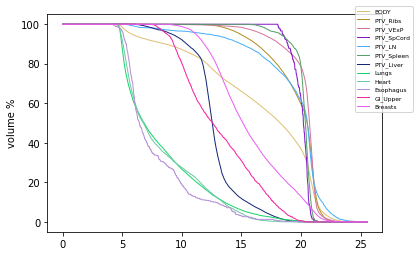

BODY
True mean organ dose is:  16.24175
True max organ dose is:  25.487581
PTV_Ribs
True mean organ dose is:  19.574183
True max organ dose is:  24.357817
PTV_VExP
True mean organ dose is:  20.340384
True max organ dose is:  25.33999
PTV_SpCord
True mean organ dose is:  20.140642
True max organ dose is:  21.631594
PTV_LN
True mean organ dose is:  19.559872
True max organ dose is:  23.662706
PTV_Spleen
True mean organ dose is:  20.300621
True max organ dose is:  23.979328
PTV_Liver
True mean organ dose is:  12.494027
True max organ dose is:  20.258163
Lungs
True mean organ dose is:  8.450191
True max organ dose is:  21.643837
Heart
True mean organ dose is:  8.082897
True max organ dose is:  19.725986
Esophagus
True mean organ dose is:  8.137591
True max organ dose is:  17.756754
GI_Upper
True mean organ dose is:  12.396065
True max organ dose is:  21.188345
Breasts
True mean organ dose is:  15.15342
True max organ dose is:  23.415844


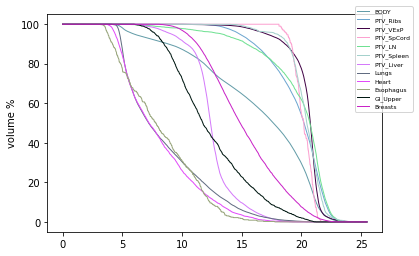

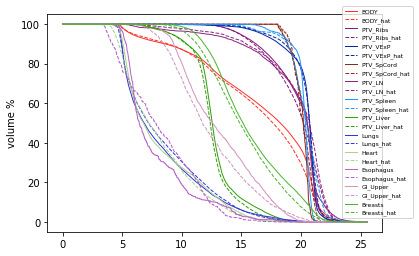

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.017799,-0.002321,0.035038,-0.009841,-0.006407,-0.009119
PTV_Ribs,-0.000139,0.039524,-0.006588,0.002333,0.031230,0.030704
PTV_VExP,0.005293,0.033836,0.019698,0.015212,0.010737,0.014462
PTV_SpCord,0.006980,0.010762,0.017730,0.011029,0.024031,0.021434
PTV_LN,0.017008,-0.062078,0.105025,0.247923,0.000523,-0.009510
PTV_Spleen,0.007014,0.122876,-0.013499,-0.068982,0.050605,0.073307
PTV_Liver,-0.018495,-0.001316,-0.005100,0.032892,-0.048113,-0.044506
Lungs,0.027678,-0.083402,-0.018032,-0.028925,-0.003144,-0.036502
Heart,-0.008881,-0.002794,-0.098702,-0.125689,-0.038537,0.017974


work on test patient  pt_2
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated.

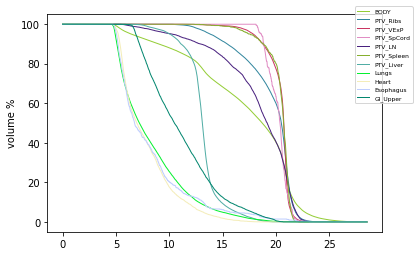

BODY
True mean organ dose is:  16.613163
True max organ dose is:  26.17564
PTV_Ribs
True mean organ dose is:  19.600698
True max organ dose is:  24.9218
PTV_VExP
True mean organ dose is:  20.61424
True max organ dose is:  25.43945
PTV_SpCord
True mean organ dose is:  20.74163
True max organ dose is:  22.213505
PTV_LN
True mean organ dose is:  18.479553
True max organ dose is:  23.818975
PTV_Spleen
True mean organ dose is:  20.54842
True max organ dose is:  23.02234
PTV_Liver
True mean organ dose is:  12.671314
True max organ dose is:  20.351053
Lungs
True mean organ dose is:  8.154686
True max organ dose is:  24.617014
Heart
True mean organ dose is:  7.6814966
True max organ dose is:  18.674612
Esophagus
True mean organ dose is:  7.730197
True max organ dose is:  21.156342
GI_Upper
True mean organ dose is:  10.388736
True max organ dose is:  22.395725
Breasts  not exist


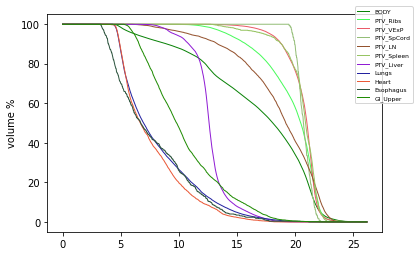

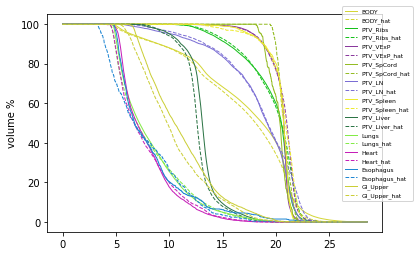

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.023399,-0.082132,-0.029334,-0.042969,-0.023864,-0.046158
PTV_Ribs,0.009108,0.009155,0.026688,0.025179,0.018054,0.013063
PTV_VExP,0.014218,0.073896,0.001377,-0.010203,0.031532,0.033652
PTV_SpCord,0.029632,0.006319,0.063685,0.073706,0.011541,0.012674
PTV_LN,0.016379,0.002074,0.067229,0.134444,0.030883,0.035770
PTV_Spleen,0.010626,0.038369,-0.012156,-0.097349,0.033977,0.039886
PTV_Liver,-0.031714,0.001554,-0.039107,0.010414,-0.021904,-0.029787
Lungs,-0.009811,0.003636,-0.039687,-0.044114,-0.001479,-0.013102
Heart,-0.018217,0.005950,-0.084646,-0.074264,0.028132,0.029846


work on test patient  pt_3
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated.

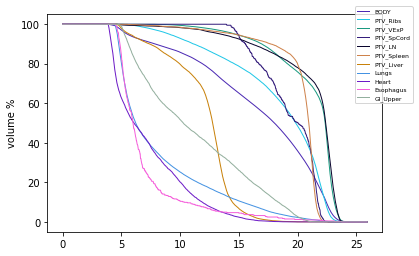

BODY
True mean organ dose is:  16.14044
True max organ dose is:  26.199411
PTV_Ribs
True mean organ dose is:  18.522303
True max organ dose is:  24.58802
PTV_VExP
True mean organ dose is:  20.623188
True max organ dose is:  26.199411
PTV_SpCord
True mean organ dose is:  20.328295
True max organ dose is:  23.372538
PTV_LN
True mean organ dose is:  20.733816
True max organ dose is:  25.76748
PTV_Spleen
True mean organ dose is:  20.484112
True max organ dose is:  23.96281
PTV_Liver
True mean organ dose is:  12.095256
True max organ dose is:  20.366833
Lungs
True mean organ dose is:  8.050892
True max organ dose is:  26.028545
Heart
True mean organ dose is:  6.8909216
True max organ dose is:  17.667862
Esophagus
True mean organ dose is:  6.5347824
True max organ dose is:  21.038395
GI_Upper
True mean organ dose is:  10.83458
True max organ dose is:  23.330317
Breasts  not exist


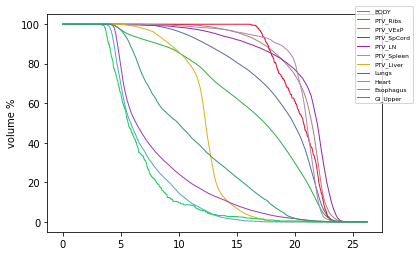

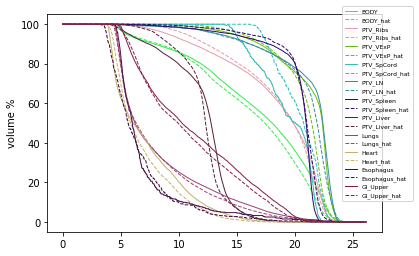

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.028747,0.010823,0.027471,0.010823,-0.020712,-0.014547
PTV_Ribs,0.012221,0.009972,0.166556,0.232667,-0.002485,0.001680
PTV_VExP,-0.020120,0.068278,0.050935,0.093186,-0.018347,-0.007526
PTV_SpCord,0.054399,0.035304,0.151581,0.156770,0.034719,0.037486
PTV_LN,-0.012776,0.049252,-0.016314,0.021985,0.000748,0.005259
PTV_Spleen,0.017158,0.057094,0.084872,0.194164,0.024083,0.029940
PTV_Liver,0.010699,-0.022368,0.416073,0.369586,0.003171,0.012409
Lungs,-0.024567,0.067221,-0.014518,-0.020856,-0.051200,-0.042684
Heart,-0.042823,-0.114359,0.056326,0.034022,-0.072444,-0.090089


work on test patient  pt_4
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
True mean organ dose is:  16.041025
True max organ dose is:  25.425552
PTV_Ribs
True mean organ dose is:  19.318348
True max organ dose is:  25.018127
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn

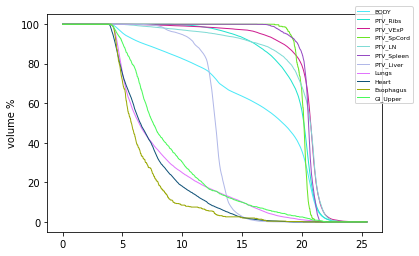

BODY
True mean organ dose is:  15.913911
True max organ dose is:  25.127432
PTV_Ribs
True mean organ dose is:  19.411558
True max organ dose is:  25.127432
PTV_VExP
True mean organ dose is:  20.277796
True max organ dose is:  24.426826
PTV_SpCord
True mean organ dose is:  20.175991
True max organ dose is:  22.146656
PTV_LN
True mean organ dose is:  19.612316
True max organ dose is:  24.256063
PTV_Spleen
True mean organ dose is:  20.56657
True max organ dose is:  22.723978
PTV_Liver
True mean organ dose is:  12.180568
True max organ dose is:  19.318571
Lungs
True mean organ dose is:  8.227023
True max organ dose is:  25.003563
Heart
True mean organ dose is:  7.371196
True max organ dose is:  17.75905
Esophagus
True mean organ dose is:  7.026671
True max organ dose is:  16.273932
GI_Upper
True mean organ dose is:  9.516408
True max organ dose is:  21.85722
Breasts  not exist


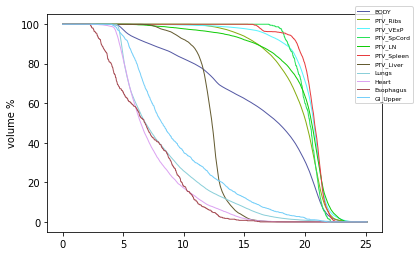

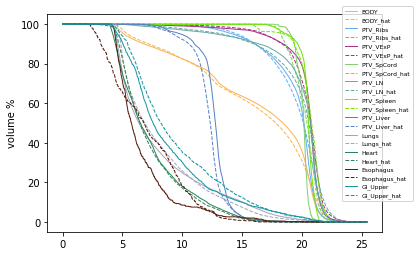

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.007924,-0.011725,0.059215,0.065141,0.014731,0.016429
PTV_Ribs,0.004825,0.004369,0.023539,0.052002,0.024052,0.020414
PTV_VExP,0.002824,-0.039280,0.008613,0.095166,0.013630,0.021010
PTV_SpCord,0.007663,0.049965,-0.040170,-0.041306,0.046623,0.049212
PTV_LN,-0.001365,-0.019406,0.038079,0.110897,0.021678,0.027965
PTV_Spleen,0.008133,0.048859,-0.010382,-0.088450,0.032632,0.037659
PTV_Liver,-0.034407,0.007011,-0.063807,-0.057588,-0.003902,-0.001842
Lungs,0.015438,0.099286,0.070631,0.082117,-0.060731,-0.056075
Heart,-0.003025,-0.077300,0.066139,0.056646,-0.021745,-0.031458


work on test patient  pt_5
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use 

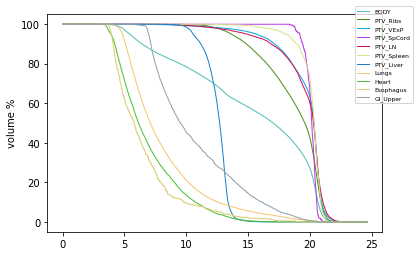

BODY
True mean organ dose is:  15.0417595
True max organ dose is:  25.042673
PTV_Ribs
True mean organ dose is:  18.90737
True max organ dose is:  24.47411
PTV_VExP
True mean organ dose is:  19.815506
True max organ dose is:  25.042673
PTV_SpCord
True mean organ dose is:  19.962626
True max organ dose is:  21.646584
PTV_LN
True mean organ dose is:  19.681684
True max organ dose is:  23.653887
PTV_Spleen
True mean organ dose is:  20.276114
True max organ dose is:  22.860392
PTV_Liver
True mean organ dose is:  12.025966
True max organ dose is:  16.834461
Lungs
True mean organ dose is:  7.8950644
True max organ dose is:  23.048012
Heart
True mean organ dose is:  6.574418
True max organ dose is:  16.69782
Esophagus
True mean organ dose is:  7.581763
True max organ dose is:  17.841288
GI_Upper
True mean organ dose is:  10.018312
True max organ dose is:  21.205393
Breasts  not exist


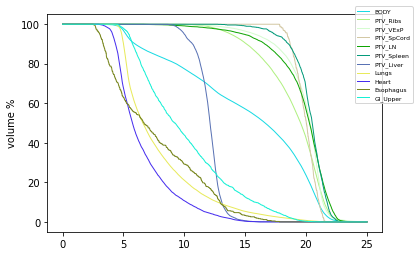

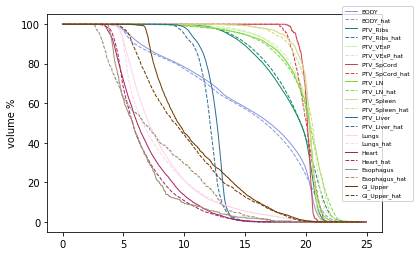

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.010279,0.017738,-0.037649,0.002200,0.026733,0.036081
PTV_Ribs,0.015339,0.083622,0.016819,0.003700,0.036727,0.044736
PTV_VExP,0.013363,0.032915,0.010537,0.071454,0.027194,0.034613
PTV_SpCord,-0.004689,0.023747,-0.037099,-0.040247,0.034163,0.035868
PTV_LN,0.010359,0.024182,-0.000751,-0.016728,0.045355,0.040251
PTV_Spleen,0.011178,0.057546,-0.034844,-0.011188,0.046356,0.055015
PTV_Liver,-0.037265,-0.008721,-0.052165,-0.058840,-0.010711,0.017738
Lungs,-0.027833,-0.015826,0.007379,0.028681,-0.012267,-0.004149
Heart,-0.044646,-0.007656,0.052942,0.052237,-0.031607,-0.003408


work on test patient  pt_6
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated.

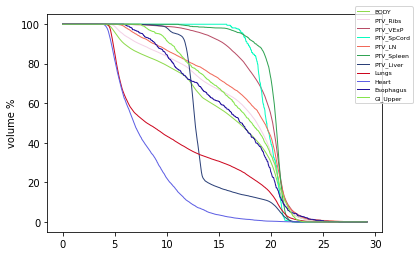

BODY
True mean organ dose is:  15.662553
True max organ dose is:  26.626177
PTV_Ribs
True mean organ dose is:  17.903194
True max organ dose is:  25.25412
PTV_VExP
True mean organ dose is:  19.680716
True max organ dose is:  25.349571
PTV_SpCord
True mean organ dose is:  20.940485
True max organ dose is:  23.415354
PTV_LN
True mean organ dose is:  17.989529
True max organ dose is:  24.747738
PTV_Spleen
True mean organ dose is:  20.415123
True max organ dose is:  23.664145
PTV_Liver
True mean organ dose is:  13.046166
True max organ dose is:  21.368765
Lungs
True mean organ dose is:  11.084608
True max organ dose is:  23.758675
Heart
True mean organ dose is:  7.607151
True max organ dose is:  17.681509
Esophagus
True mean organ dose is:  15.057027
True max organ dose is:  24.933968
GI_Upper
True mean organ dose is:  16.479715
True max organ dose is:  23.268097
Breasts  not exist


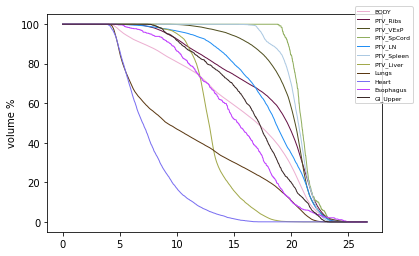

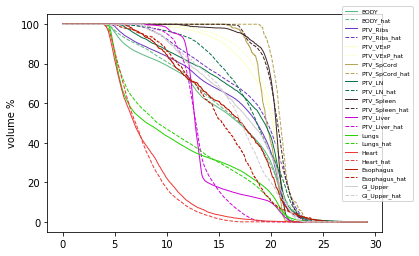

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,0.019138,-0.088314,0.059737,0.012984,0.020234,0.012466
PTV_Ribs,0.089258,-0.042260,0.587433,0.553718,0.035232,0.013049
PTV_VExP,0.022417,-0.077621,0.076377,0.098907,0.012451,-0.003825
PTV_SpCord,0.072554,0.061433,0.117104,0.154215,0.088589,0.091640
PTV_LN,0.043443,-0.152632,0.572846,0.399935,0.013118,-0.009187
PTV_Spleen,0.016968,0.070032,0.012041,0.096591,0.049499,0.056026
PTV_Liver,-0.047095,-0.052954,-0.090720,-0.142644,-0.181395,-0.160404
Lungs,0.017145,-0.080397,-0.017311,-0.023822,-0.007834,-0.012239
Heart,-0.027947,-0.223729,0.021922,-0.004302,-0.066334,-0.109328


work on test patient  pt_7
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use 

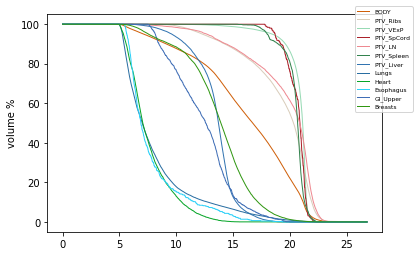

BODY
True mean organ dose is:  15.537778
True max organ dose is:  24.488472
PTV_Ribs
True mean organ dose is:  19.03353
True max organ dose is:  24.446985
PTV_VExP
True mean organ dose is:  20.523378
True max organ dose is:  23.817606
PTV_SpCord
True mean organ dose is:  20.817747
True max organ dose is:  22.339205
PTV_LN
True mean organ dose is:  19.2691
True max organ dose is:  23.59526
PTV_Spleen
True mean organ dose is:  20.349365
True max organ dose is:  23.080095
PTV_Liver
True mean organ dose is:  12.92999
True max organ dose is:  19.993813
Lungs
True mean organ dose is:  7.92011
True max organ dose is:  23.699783
Heart
True mean organ dose is:  7.1820416
True max organ dose is:  16.859924
Esophagus
True mean organ dose is:  8.225271
True max organ dose is:  17.358076
GI_Upper
True mean organ dose is:  11.992805
True max organ dose is:  18.365334
Breasts
True mean organ dose is:  13.280298
True max organ dose is:  22.581087


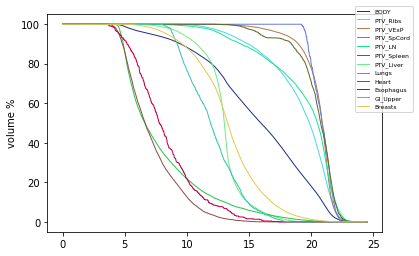

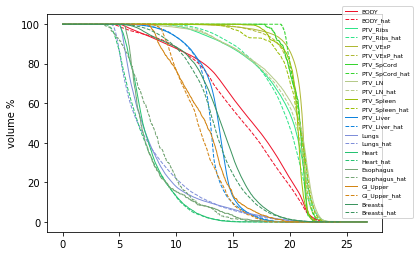

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.030371,-0.085357,0.000445,-0.089533,-0.002777,-0.005991
PTV_Ribs,-0.005583,0.030498,0.084833,0.089716,-0.010467,-0.012792
PTV_VExP,-0.008815,0.036133,-0.038231,-0.011791,0.017342,0.024828
PTV_SpCord,0.012117,0.006497,0.046991,0.066074,0.021077,0.018453
PTV_LN,-0.009243,-0.113852,0.008329,0.094996,-0.004942,-0.004954
PTV_Spleen,-0.003167,0.030004,-0.117342,-0.154850,0.025715,0.028344
PTV_Liver,-0.034837,-0.014066,0.002663,0.016270,-0.003652,0.009726
Lungs,-0.022846,-0.079028,-0.106303,-0.113939,-0.018262,-0.021020
Heart,-0.057092,0.064912,-0.151668,-0.168506,-0.013703,-0.008264


work on test patient  pt_8
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
True mean organ dose is:  15.867255
True max organ dose is:  26.531534
PTV_Ribs
True mean organ dose is:  19.203957
True max organ dose is:  24.128597
PTV_VExP
True mean organ dose is:  20.020134
True max organ dose is:  24.245338
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".for

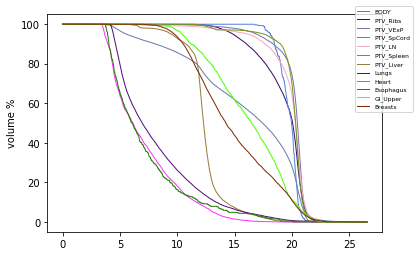

BODY
True mean organ dose is:  15.82597
True max organ dose is:  26.583263
PTV_Ribs
True mean organ dose is:  19.242455
True max organ dose is:  24.47991
PTV_VExP
True mean organ dose is:  20.230503
True max organ dose is:  25.87985
PTV_SpCord
True mean organ dose is:  20.355293
True max organ dose is:  22.140446
PTV_LN
True mean organ dose is:  19.970814
True max organ dose is:  23.408222
PTV_Spleen
True mean organ dose is:  20.21861
True max organ dose is:  23.313107
PTV_Liver
True mean organ dose is:  12.227197
True max organ dose is:  20.000689
Lungs
True mean organ dose is:  8.542465
True max organ dose is:  24.127453
Heart
True mean organ dose is:  7.2832594
True max organ dose is:  18.386198
Esophagus
True mean organ dose is:  7.782419
True max organ dose is:  20.400873
GI_Upper
True mean organ dose is:  15.823691
True max organ dose is:  22.652454
Breasts
True mean organ dose is:  15.185512
True max organ dose is:  23.972952


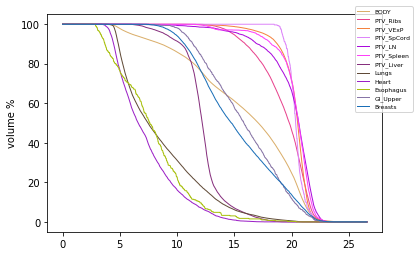

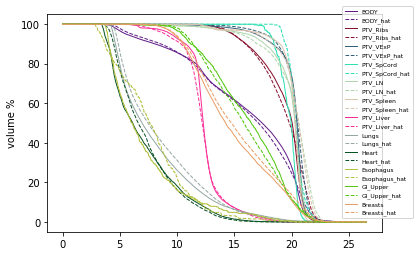

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.002602,0.001950,0.088036,0.070852,0.020224,0.016010
PTV_Ribs,0.002005,0.014560,0.003739,0.020432,0.028911,0.029113
PTV_VExP,0.010508,0.067416,0.045205,0.069697,0.020121,0.020425
PTV_SpCord,0.033899,0.017765,0.059204,0.078907,0.039723,0.048936
PTV_LN,0.013416,-0.013050,-0.041685,0.028778,0.039359,0.031831
PTV_Spleen,0.014525,0.053603,-0.034375,0.006019,0.042936,0.050108
PTV_Liver,-0.013516,-0.025584,-0.054261,0.003714,-0.008103,-0.026008
Lungs,0.047582,-0.063590,0.055947,0.051429,-0.014876,-0.037782
Heart,0.037277,-0.040761,0.150790,0.122034,-0.020406,-0.034618


work on test patient  pt_9
X size, Y size, Y_hat size (1, 32, 96, 128, 12) (1, 32, 96, 128, 1) (1, 32, 96, 128, 1)
BODY
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3328: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
C:\Users\Varian600c\.conda\envs\pytorch-gpu\lib\site-packages\torch\nn\functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated.

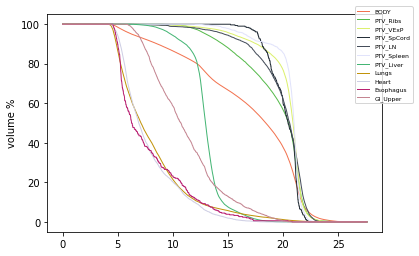

BODY
True mean organ dose is:  16.356115
True max organ dose is:  25.204643
PTV_Ribs
True mean organ dose is:  19.35501
True max organ dose is:  24.692389
PTV_VExP
True mean organ dose is:  20.3566
True max organ dose is:  24.863905
PTV_SpCord
True mean organ dose is:  19.872498
True max organ dose is:  22.31855
PTV_LN
True mean organ dose is:  19.518633
True max organ dose is:  24.09214
PTV_Spleen
True mean organ dose is:  20.332104
True max organ dose is:  22.691248
PTV_Liver
True mean organ dose is:  12.508169
True max organ dose is:  19.842241
Lungs
True mean organ dose is:  8.200294
True max organ dose is:  23.559214
Heart
True mean organ dose is:  7.752527
True max organ dose is:  17.010254
Esophagus
True mean organ dose is:  8.468971
True max organ dose is:  18.981428
GI_Upper
True mean organ dose is:  10.944287
True max organ dose is:  21.255505
Breasts  not exist


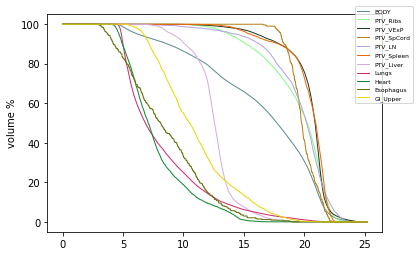

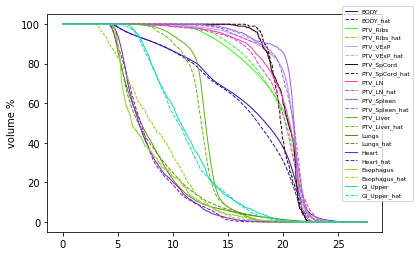

,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,-0.022546,-0.087297,-0.004873,0.002997,-0.017220,-0.025871
PTV_Ribs,0.006596,-0.055841,0.062072,0.060016,0.005568,-0.000931
PTV_VExP,0.005474,0.000415,0.042506,0.078996,0.006313,0.020375
PTV_SpCord,-0.011548,0.001333,0.020205,0.043089,0.004496,0.000308
PTV_LN,-0.014990,0.010259,-0.022780,-0.047840,0.012794,0.018378
PTV_Spleen,-0.009366,-0.007458,-0.058274,-0.032162,0.008807,0.006532
PTV_Liver,-0.034113,-0.040170,-0.075744,-0.054134,-0.013616,-0.016244
Lungs,0.014132,-0.047532,0.039242,0.052260,0.023235,-0.000627
Heart,-0.006188,-0.076964,-0.056789,-0.046793,0.030928,-0.023070


,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,1.578901,3.581176,4.563432,5.525861,1.034518,1.296137
PTV_Ribs,1.485181,2.609858,7.528228,8.302290,1.382974,1.384077
PTV_VExP,0.814258,3.612598,3.309046,5.959064,1.217460,1.465794
PTV_SpCord,2.059476,3.590799,4.075327,4.773094,3.783658,4.052120
PTV_LN,1.366108,3.907127,7.304191,11.811454,1.643010,1.829718
PTV_Spleen,1.376943,4.191728,4.708482,8.166167,2.588007,3.195212
PTV_Liver,2.884094,2.706950,7.147051,7.774166,3.006684,3.364325
Lungs,2.941521,4.754737,6.929142,7.963477,2.136926,2.530786
Heart,2.993992,6.152604,6.946884,7.152114,3.979093,4.171539


,Dmean,Dmax,D95,D98,D5,D2
Organ,,,,,,
BODY,0.879244,3.009122,4.409592,6.959029,0.800140,1.132740
PTV_Ribs,1.938952,1.991108,12.395872,12.009910,1.236250,1.178483
PTV_VExP,0.590098,2.477883,2.408936,3.931733,0.886875,0.998327
PTV_SpCord,1.897143,2.307737,3.777408,4.470797,1.993408,2.109979
PTV_LN,0.983839,3.867772,11.987498,11.311638,1.289566,1.056909
PTV_Spleen,0.912118,2.667045,3.397263,5.399898,1.435164,1.739162
PTV_Liver,1.210980,2.564415,8.765030,8.450340,4.178049,3.463966
Lungs,2.339683,3.511243,7.891108,8.204566,1.763430,1.631996
Heart,1.817502,5.297676,4.787852,5.548417,2.717090,3.278911


(               Dmean       Dmax        D95        D98        D5         D2
 Organ                                                                     
 BODY        1.578901   3.581176   4.563432   5.525861  1.034518   1.296137
 PTV_Ribs    1.485181   2.609858   7.528228   8.302290  1.382974   1.384077
 PTV_VExP    0.814258   3.612598   3.309046   5.959064  1.217460   1.465794
 PTV_SpCord  2.059476   3.590799   4.075327   4.773094  3.783658   4.052120
 PTV_LN      1.366108   3.907127   7.304191  11.811454  1.643010   1.829718
 PTV_Spleen  1.376943   4.191728   4.708482   8.166167  2.588007   3.195212
 PTV_Liver   2.884094   2.706950   7.147051   7.774166  3.006684   3.364325
 Lungs       2.941521   4.754737   6.929142   7.963477  2.136926   2.530786
 Heart       2.993992   6.152604   6.946884   7.152114  3.979093   4.171539
 Esophagus   7.108207  10.210264  22.078343  26.185907  7.220324  10.816053
 GI_Upper    2.840744   3.539597   9.498057   9.751510  3.307221   3.646563
 Breasts    

In [12]:
predict_unit_test(test_path = 'Data/npy_dataset/training_test/')

In [ ]:
print(metrics_all.keys())
metrics_all['patient_4']

In [45]:
from random import sample
list1= range(240)
list2 = sample(list1,100)
list3 = list(set(list1)-set(list2))
print (list3)

[3, 4, 5, 12, 13, 15, 18, 19, 21, 22, 23, 26, 27, 28, 30, 31, 32, 33, 34, 39, 40, 41, 44, 45, 46, 47, 48, 51, 52, 54, 55, 57, 60, 61, 63, 64, 67, 69, 70, 75, 77, 78, 79, 80, 82, 83, 84, 85, 86, 87, 89, 92, 93, 96, 97, 98, 99, 100, 101, 107, 113, 114, 117, 118, 121, 122, 124, 125, 126, 127, 130, 131, 132, 133, 135, 136, 138, 139, 141, 142, 144, 145, 146, 148, 151, 154, 156, 158, 159, 162, 164, 165, 166, 167, 168, 169, 170, 171, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 185, 186, 187, 188, 193, 194, 195, 200, 202, 204, 205, 206, 208, 209, 210, 213, 214, 217, 218, 220, 221, 222, 223, 225, 226, 227, 233, 235, 237, 238, 239]
